In [1]:
from math import ceil

import numpy as np
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
from pandas import DataFrame, Timestamp, options
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.stattools import acf

# Suppress chained assignment warnings
options.mode.chained_assignment = None

from icefreearcticml.constants import (
    MODELS,
    MODEL_COLOURS,
    VARIABLES as VAR_NAMES,
    VAR_YLABELS,
    VAR_YLABELS_SHORT,
)
from icefreearcticml.liangindex import compute_liang
from icefreearcticml.utils import (
    calculate_bias,
    calculate_combined_pvalues,
    calculate_correlation_ensemble_mean,
    calculate_ensemble_max,
    calculate_ensemble_mean,
    calculate_ensemble_min,
    calculate_first_icefree_year,
    calculate_liang_model_flows,
    calculate_tau_avg,
    filter_by_years,
    get_shape_df,
    plot_variable,
    prepare_for_liang,
    read_model_data_all,
    subtract_ensemble_mean,
)

MODEL_NAMES = MODELS[:-1]   # Exclude 'Observations' from the model names
VARIABLES_ = VAR_NAMES[:-2] # Exclude swfd and lwfd

In [2]:
model_data = read_model_data_all()

In [3]:
shapes_df = get_shape_df(model_data)
shapes_df

,EC-Earth3,CESM2,MPI-ESM1-2-LR,CanESM5,ACCESS-ESM1-5,Observations
ssie,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(45,)"
wsie,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(45,)"
wsiv,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(45,)"
tas,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(54,)"
oht_atl,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(40,)"
oht_pac,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(40,)"
swfd,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(23,)"
lwfd,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(23,)"


<div lang="fr" style="display: none">
<p>Dans cette tableau, on voit les dimension de chaque jeu de données par modèle et variable. Les jeu de données d'observations sont unidimensionnels, et ils sont des périodes d'observations différentes. Tous les jeux de données des modèles sont bidimensionnels ; ils ont tous la même dimension temporelle (chacun a 131 pas de temps), mais ils différent par rapport au nombre d'ensembles. La plupart en ont 50 ; cependant, MPI-ESM1-2-LR en a 30, et ACCESS-ESM1-5 en a 40. En plus, pour les variables d'OHT, CanESM5 a 49 ensembles.<p>
</div>

<div lang="en">
<p>Here we can see the shapes for each of the datasets by model and variable. The observations datasets are 1D and have different observational periods. All model datasets are 2D, consistent across the time dimension (each has 131 time steps), but varying across the number of ensembles. Most have 50 ensembles; however, MPI-ESM1-2-LR has 30 and ACCESS-ESM1-5 has 40. In addition, CanESM5 has 49 ensembles for the OHT variables.</p>
</div>

In [4]:
observations = {var: model_data[var]['Observations'] for var in VAR_NAMES}

# Calculate the average of all model ensembles 
model_ensemble_avgs = {
    var: {
        model: calculate_ensemble_mean(model_data[var][model]) for model in MODEL_NAMES
    } for var in VARIABLES_
}

# Calculate the first icefree year based on SSIE for each model ensemble average
model_ensemble_avg_icefree_years = {
    model: calculate_first_icefree_year(model_ensemble_avgs["ssie"][model])
    for model in MODEL_NAMES
}

# Calculate the first icefree year based on SSIE for each of the model ensembles
model_ensemble_icefree_years = {
    model: calculate_first_icefree_year(model_data["ssie"][model])
    for model in MODEL_NAMES
}

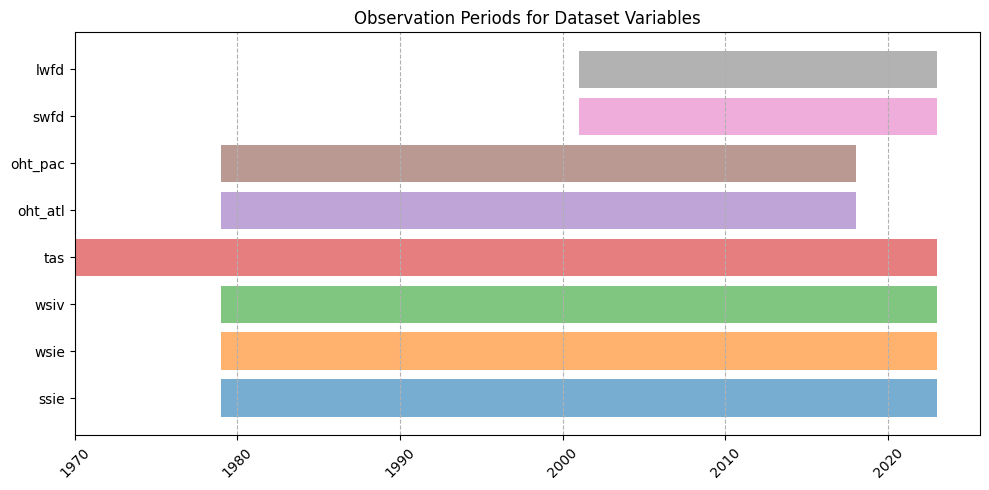

In [5]:
fig, ax = plt.subplots(figsize=(10, 5))

for i, (var, obs_series) in enumerate(observations.items()):
    start = obs_series.index[0]
    end = obs_series.index[-1] 
    ax.barh(var, width=(end - start).days, left=start, alpha=0.6, label=var)

ax.xaxis.set_major_locator(mdates.YearLocator(10))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
plt.xticks(rotation=45)

plt.grid(axis="x", linestyle="--")
plt.title("Observation Periods for Dataset Variables")
plt.tight_layout()
plt.show()

This graph shows the different time periods for each observational dataset. Temperature has the longest period, spanning over 50 years. LWFD and SWFD have the shortest, as they both begin in 2001 and are just over 20 years long. All other variables start in 1979 and have a period of about 40 years.

<div style="display: none">Ce graphique-ci présente les périodes différentes pour chaque jeu de données d'observation. Le température a la période la plus longue, s'étendant sur plus de 50 ans. LWFD et SWFD ont les périodes les plus courtes, étant donné qu'ils commencent tous les deux en 2001 avec une longeur de plus 20 ans. Toutes les autres variables comment en 1979 pour une période d'environ 40 ans.</div>

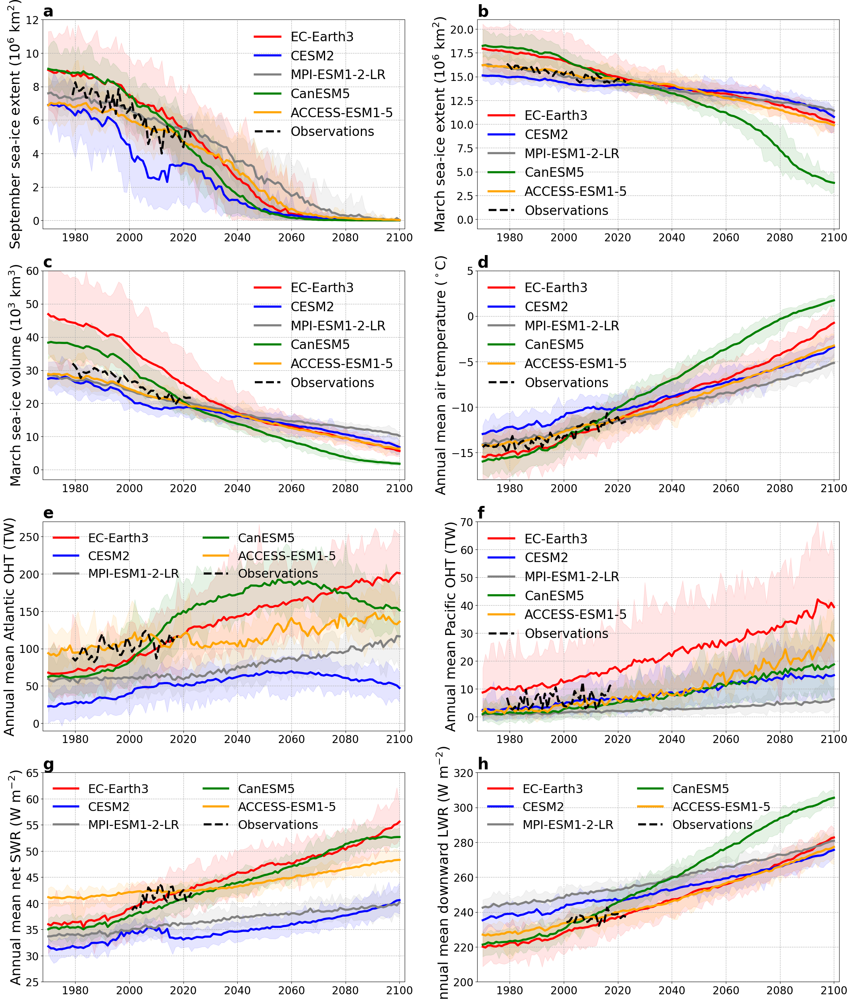

In [6]:
fig,axes = plt.subplots(4,2,figsize=(24,28))
for i, ax in enumerate(axes.flatten()):
    var = VAR_NAMES[i]
    plot_variable(ax, var, model_data[var], VAR_YLABELS[var], i)

fig.subplots_adjust(left=0.08,bottom=0.05,right=0.95,top=0.95,hspace=0.2,wspace=0.2)

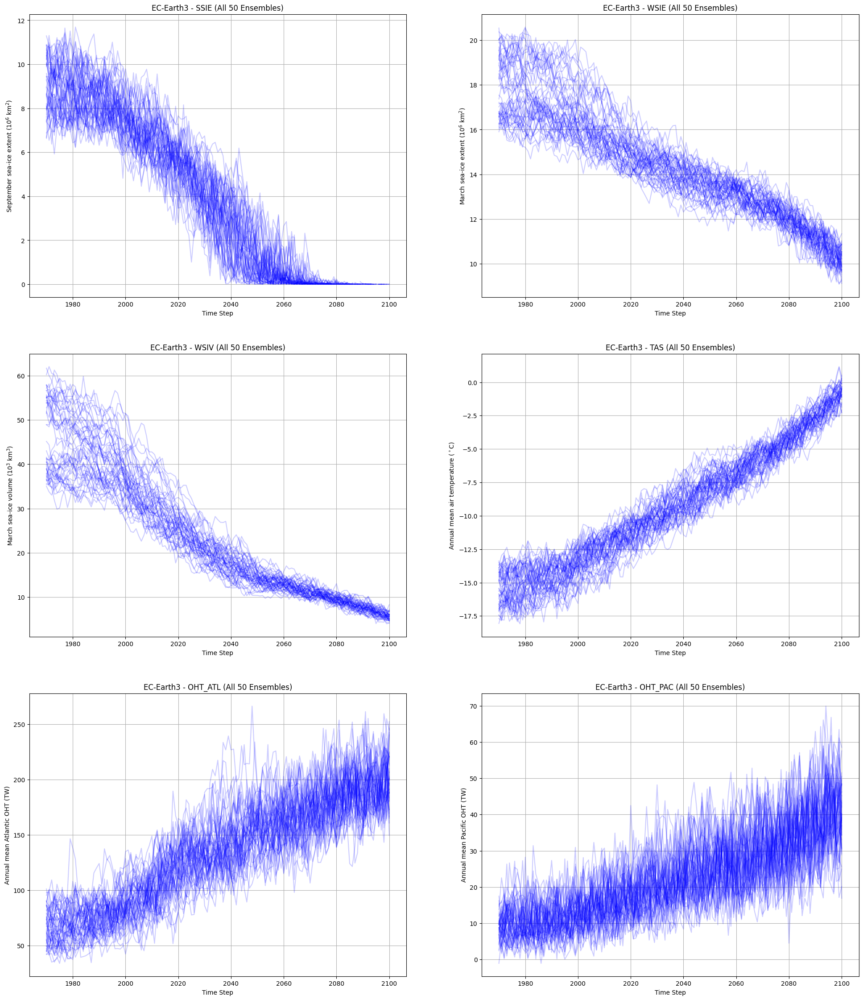

In [7]:
plot_rows = ceil(len(VARIABLES_) / 2)

model = "EC-Earth3" # EC-Earth3, CESM2, MPI-ESM1-2-LR, CanESM5, ACCESS-ESM1-5

fig, axes = plt.subplots(nrows=plot_rows, ncols=2, figsize=(24, 28))
for i, ax in enumerate(axes.flat):
    var = VARIABLES_[i] 
    data = model_data[var][model]
    ax.plot(data, color="blue", alpha=0.2)

    ax.set_title(f"{model} - {var.upper()} (All {data.shape[1]} Ensembles)")
    ax.set_xlabel("Time Step")
    ax.set_ylabel(VAR_YLABELS[var])
    ax.grid(True)

plt.show()

The purpose behind this graph is to examine the distribution of different ensemble realisations for variables of a given model. We wanted to see how the ensembles are distributed between the minimum and maximum, and we note that they are generally distributed uniformly between the extremes. For some models, the spread of the extremes is particularly narrower than others; CanESM5 is notably narrow for both variables, and CESM2 shows a reduced spread for WSIE. In contrast, EC-Earth3 has a fairly wide spread of the extremes. In any case, all models have a tendency to display a small spread around 2100.

<div style="display: none">
L'idée de ce graphique est d'examiner la distribution des réalisations d'ensemble différentes pour les variables d'un modèle donné. On voulait voir comment les ensembles sont distribués entre le minimum et le maximum. On note que les enembles différents pour une variable donnée sont généralement distribués de manière uniforme entre le max et le min. Pour certains modèles, l'écart des extrêmes est particulièrement plus étroit que d'autres ; CanESM5 est notamment étroit pour les deux variables, et CESM2 montre un écart réduit pour WSIE. En revanche, EC-Earth3 présente une différence des extrêmes assez large. En tout cas, tous les modèles a une tendance de converger vers 2100.
</div>

## Biases

In [8]:
# Date strings must have the format "YYYY-MM-DD"
bias_start = "1980-01-01"
bias_end = "2014-01-01"

# Calculate the biases using the model ensemble averages
model_ensemble_avg_biases = {
    var: {
        model: calculate_bias(model_data[var]["Observations"], model_ensemble_avgs[var][model], bias_start, bias_end)
        for model in MODEL_NAMES
    } for var in VARIABLES_
}

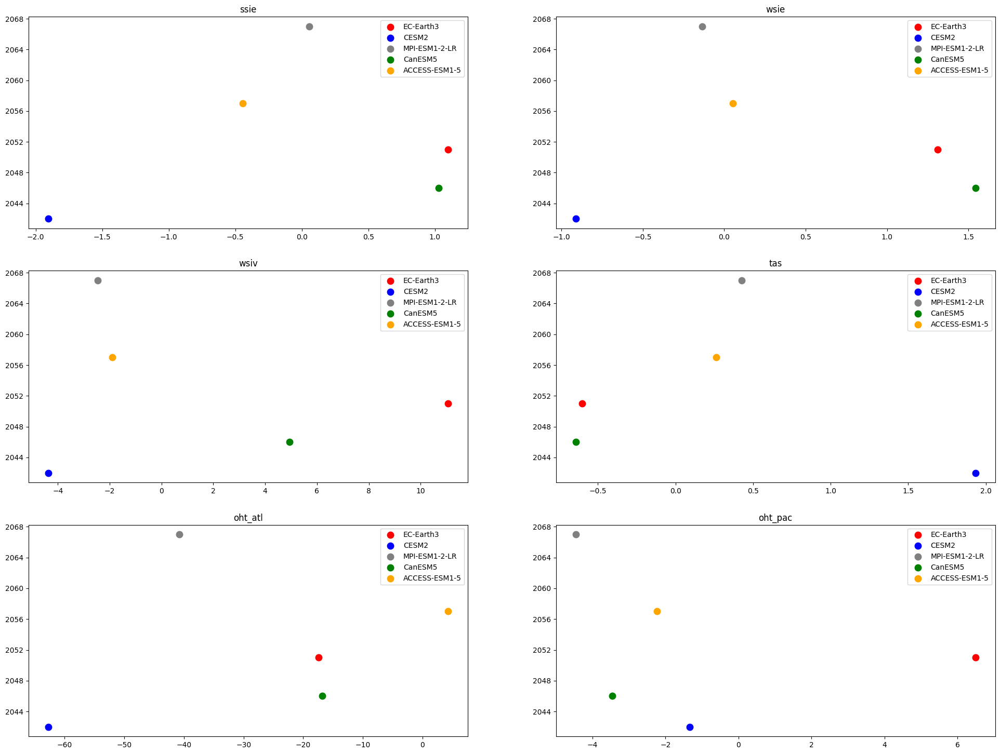

In [9]:
fig,axes = plt.subplots(plot_rows, 2, figsize=(24,18))

y = list(model_ensemble_avg_icefree_years.values())

for i, ax in enumerate(axes.flatten()):
    var = VARIABLES_[i]
    x = list(model_ensemble_avg_biases[var].values())
    for j in range(len(x)):
        model_name = MODEL_NAMES[j]
        ax.scatter(x[j], y[j], color=MODEL_COLOURS[model_name], label=f'{model_name}', linewidths=4)
    ax.set_title(var)
    ax.legend()

np.int64(6)

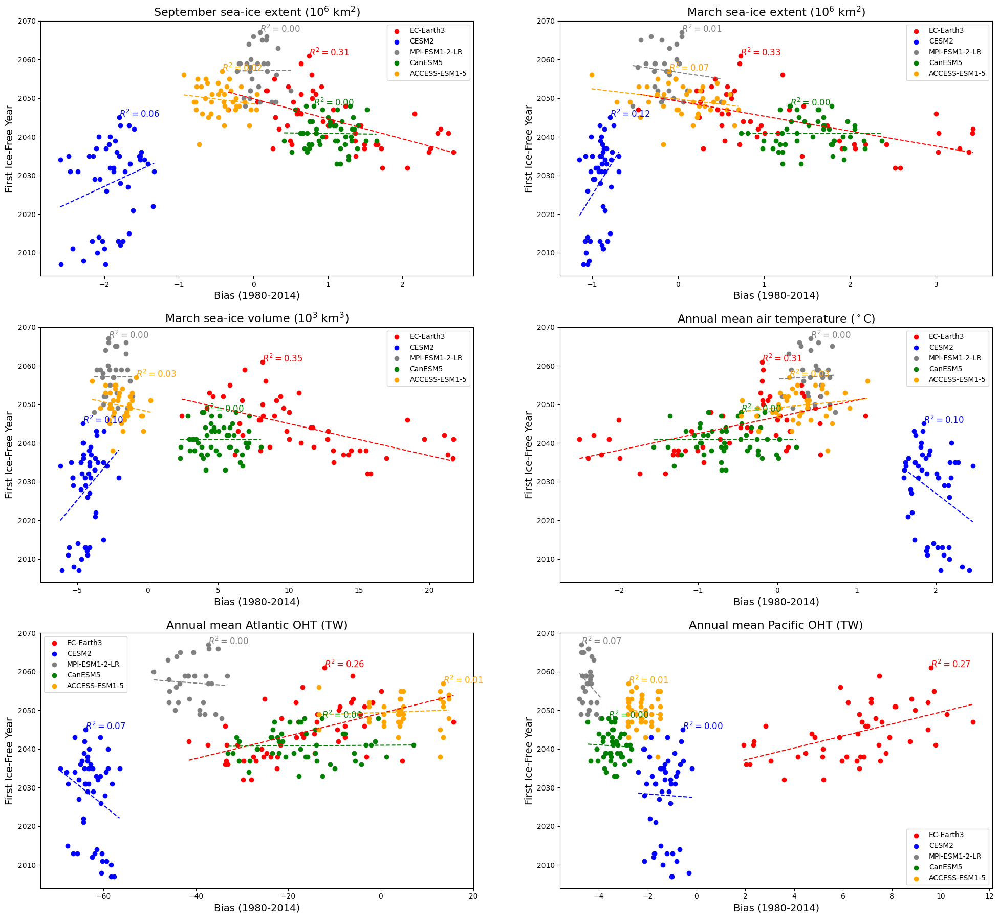

In [34]:
# Calculate the biases of all the model ensembles
model_ensemble_biases = {
    var: {
        model: calculate_bias(model_data[var]["Observations"], model_data[var][model], bias_start, bias_end)
        for model in MODEL_NAMES
    } for var in VARIABLES_
}


fig,axes = plt.subplots(plot_rows,2,figsize=(24,22))

for i, ax in enumerate(axes.flatten()):
    var = VARIABLES_[i]
    for model in MODEL_NAMES:
            x = model_ensemble_biases[var][model].to_numpy()
            y = model_ensemble_icefree_years[model].dt.year.to_numpy()

            fit = LinearRegression().fit(x.reshape(-1, 1), y.reshape(-1, 1))

            ax.scatter(x, y, c=MODEL_COLOURS[model], label=model)

            predict_x = np.linspace(x.min(), x.max())
            predict_y = fit.predict(predict_x.reshape(-1, 1))

            ax.plot(predict_x, predict_y, color=MODEL_COLOURS[model], linestyle="--")
            r2 = fit.score(x.reshape(-1, 1), y.reshape(-1, 1))

            text_y = y.max()
            text_x = x[y.argmax()]

            ax.text(text_x, text_y, f'$R^2 = {r2:.2f}$', fontsize=12, color=MODEL_COLOURS[model]) 


    ax.legend()
    ax.set_title(VAR_YLABELS[var], fontsize=16)
    ax.set_xlabel("Bias (1980-2014)", fontsize=14)
    ax.set_ylabel("First Ice-Free Year", fontsize=14)

In this graph, we plot the biases of each variable over the period 1980-2014 against the first ice-free year, defined by the first year when the summer sea ice extent falls below 1 million km². Regression lines done for each model independently (per variable) are also plotted.

Overall no strong relationship is present across the models for all variables. Most of the $R^2$s are small, though usually the EC-Earth3 model obtains an $R^2$ close to 0.3. CESM2 also tends to slow a slight relationship. In the example of summer sea-ice extent, while it appears that there is a negative relationship between ice-year free years and biases across the models excluding CESM, looking more closely we can see that only EC-Earth3 exhibits this relationsihp, and the other models display a rather flat relationship.




For the summer sea ice extent, the biases of the CESM2 model are all negative and correspond to the earliest first ice-free years. However, the most positive biases, from the EC-Earth3 and CanESM5 models, also produce relatively early first ice-free years compared to those estimated by models with low biases. The biases found between these two extremes correspond to the latest first ice-free years, namely the ACCESS-ESM1-5 and MPI-ESM1-2-LR models. This corresponds to what we see in figure X (David's plot); models with high bias, whether negative or positive — that is, EC-Earth3, CanESM5, and CESM2 — tend to underestimate the first ice-free year.

We see a similar pattern for the winter sea ice extent, corresponding to what is shown in figure X; EC-Earth3 and CanESM5 overestimate the observations, while CESM2 underestimates them, and ACCESS-ESM1-5 as well as MPI-ESM1-2-LR match the observations well. The structure of the first ice-free years for this variable remains the same because it is still based on the summer sea ice extent.

The winter sea ice volume shows a similar pattern to the previous variables, although this time the ACCESS-ESM1-5 and MPI-ESM1-2-LR models exhibit higher biases.

For the annual temperature, we observe a pattern similar to the previous figures, but the models with negative and positive biases are reversed. CESM2 is positive, whereas EC-Earth3 and CanESM5 are negative.

The ocean heat transport variables show completely different patterns. In the figure of Atlantic OHT, we still see that CESM2 shows strong negative biases, but this is also the case for MPI-ESM1-2-LR, leading to a situation where the latest first ice-free years are associated with strong biases. In this figure, the lowest biases come from ACCESS-ESM1-5, EC-Earth3, and CanESM5.


<div style="display: none">Dans ce graphique, nous traçons les biais de chaque variable sur la période de 1980-2014 contre la première année sans glace, indiqué par la première année quand l'étendue de la glace de mer en été atteint moins de 1M km2. 

Pour l'étendue de la grace de mer en été, nous voyons une forme plutôt comme la lettre v à l'envers. Les biais du modèle CESM2 sont tous négatifs, et correspondent aux premières années sans glace les plus tôts. Cependant, les biais les plus positifs, des modèles EC-Earth3 et CanESM5, génèrent également les premières années sans glace assez tôts, par rapport à celles éstimées par les modèles des biais faibles. Les biais trouvés entre les deux extrêmes donnent les premières années sans glace les plus tards, à savoir les modèles ACCESS-ESM1-5 et MPI-ESM1-2-LR. Tout cela corrspond à ce que nous voyons sur la figure X ; les modèles présentant un bias élevé, qu'il soit négatif ou positif, à savoir EC-Earth3, CanESM5, ainsi que CESM2, tendent à sous-estimer la première année sans glace.

Nous voyons une forme similaire pour l'étendue de la glace de mer en hiver, correspondant à ce qui est vu sur la figure X ; EC-Earth3 et CanESM5 sur-estiment les observations, tandis que CESM2 les sous-estiment, et ACCESS-ESM1-5 ainsi que MPI-ESM1-2-LR suivent bien les obseravations. La structure des premières années sans glace pour cette variable reste pareil parce qu'on utilise encore celles basées sur l'étendue de la glace de mer en été.

La volume de glace de mer en hiver présente un figure similaire aux variables précédentes, même si cette fois-ci, les modèles ACCESS-ESM1-5 et MPI-ESM1-2-LR présente des biais plus élevés. 

Pour la température annuelle, on voit une forme similaire aux figures précédentes, mais les modèles de biais négatifs et positifs sont à l'enverse. CESM2 est positif, tandis que EC-Earth3 et CanESM5 sont négatifs. 

Les variables de transport de chaleur océanique présentent des formes complétement différentes. Dans la figure d'OHT atlantique, on voit encore que CESM2 montre des biais fort négatifs, mais c'est également le cas pour MPI-ESM1-2-LR, menant à une situation où les premières années sans glaces les plus tards sont associées à un biais fort. Dans cette figure, les biais les plus faibles proviennent de ACCESS-ESM1-5, EC-Earth3 et CanESM5.</div>



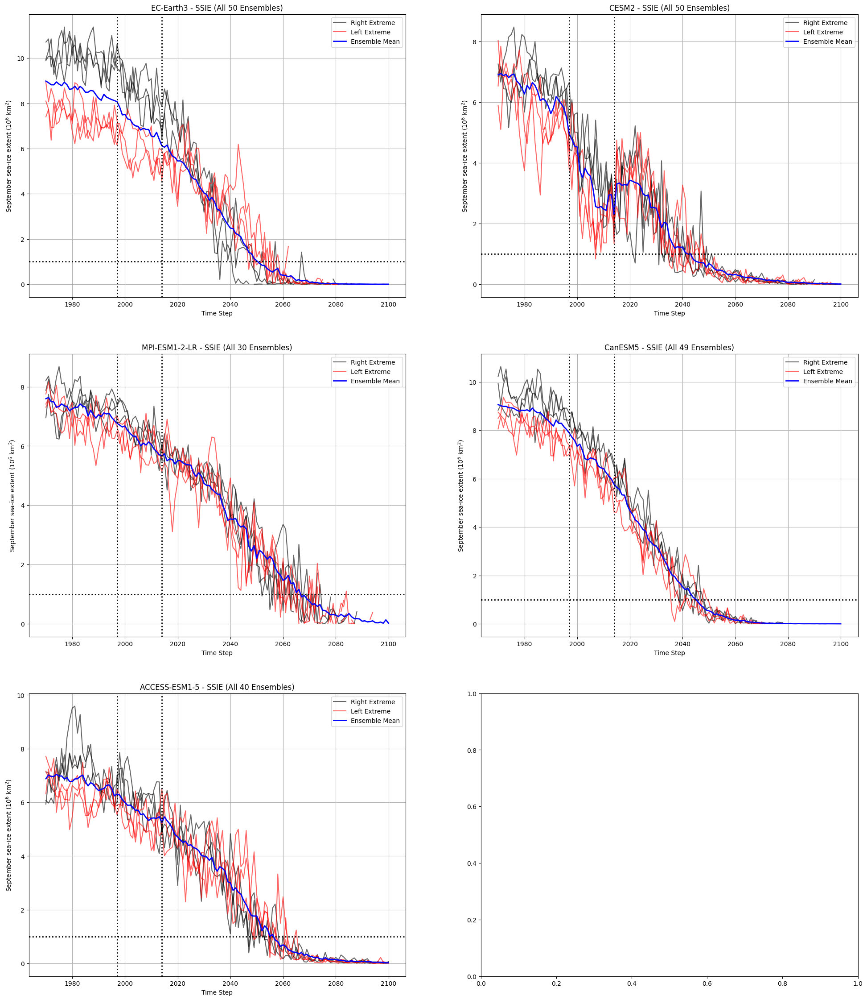

In [39]:

top = 3

plot_rows = ceil(len(MODEL_NAMES) / 2)

var = "ssie" # EC-Earth3, CESM2, MPI-ESM1-2-LR, CanESM5, ACCESS-ESM1-5

fig, axes = plt.subplots(nrows=plot_rows, ncols=2, figsize=(24, 28))
for i, ax in enumerate(axes.flat):
    if i < len(MODEL_NAMES):
        model = MODEL_NAMES[i] 
    else:
        continue
    data = model_data[var][model]

    biases = model_ensemble_biases[var][model]
    years = model_ensemble_icefree_years[model]

    df = DataFrame({"Bias": biases, "Year": years}).sort_values(by="Bias", ascending=False)
    
    # Right bias extremes
    pos_biases = df.head(top)
    ax.plot(data[pos_biases.index], color="black", alpha=0.6)
    ax.plot([], [], color="black", alpha=0.6, label="Right Extreme")

    # Left bias extremes
    neg_biases = df.tail(top)
    ax.plot(data[neg_biases.index], color="red", alpha=0.6)
    ax.plot([], [], color="red", alpha=0.6, label="Left Extreme")

    # Ensemble mean
    ax.plot(model_ensemble_avgs[var][model], color="blue", lw=2, label="Ensemble Mean")

    # GFED era
    ax.axvline(x=Timestamp('1997-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
    ax.axvline(x=Timestamp('2014-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
    ax.axhline(y=1, color='black', linestyle=':', linewidth=2)

    ax.legend()

    ax.set_title(f"{model} - {var.upper()} (All {data.shape[1]} Ensembles)")
    ax.set_xlabel("Time Step")
    ax.set_ylabel(VAR_YLABELS[var])
    ax.grid(True)

plt.show()



For these plots we consider the ensemble members with the 5 largest and 5 lowest biases for each model. We plot them with the ensemble average. The horizontal line indicates the ice-free levels, and the vertical lines indicate the GFED period. 

For the CESM2 model, which showed the earliest ice-free years, appears particularly affected by the GFED period, in line with previous research. It is during this period that the model reaches ice-free years for the first time, and these are associated with the most negative biases, reflecting the positive relationship exhibited by this model.

For EC-Earth3, which has displayed negative relationship between bias and ice-free years, we see that the ensembles associated with the smallest biases (red) are below the ensemble average (blue), while the ensembles associated with the largest biases (black) are above the ensemble average. However, after the observational period, the red ensembles mostly switch to be on top of the average, while the black ensembles switch to the bottom, and so it is the ensembles with the largest biases that obtain the earliest ice-free years.

The other models present less obvious behaviour. These models did not show strong relationships between bias and ice-free years, While we generally see the red ensembles on the bottom and the black ensembles on top in the beginning, once the observational period finishes, the ensembles mix, leading to no clear relationship once the first ice-free years are met.


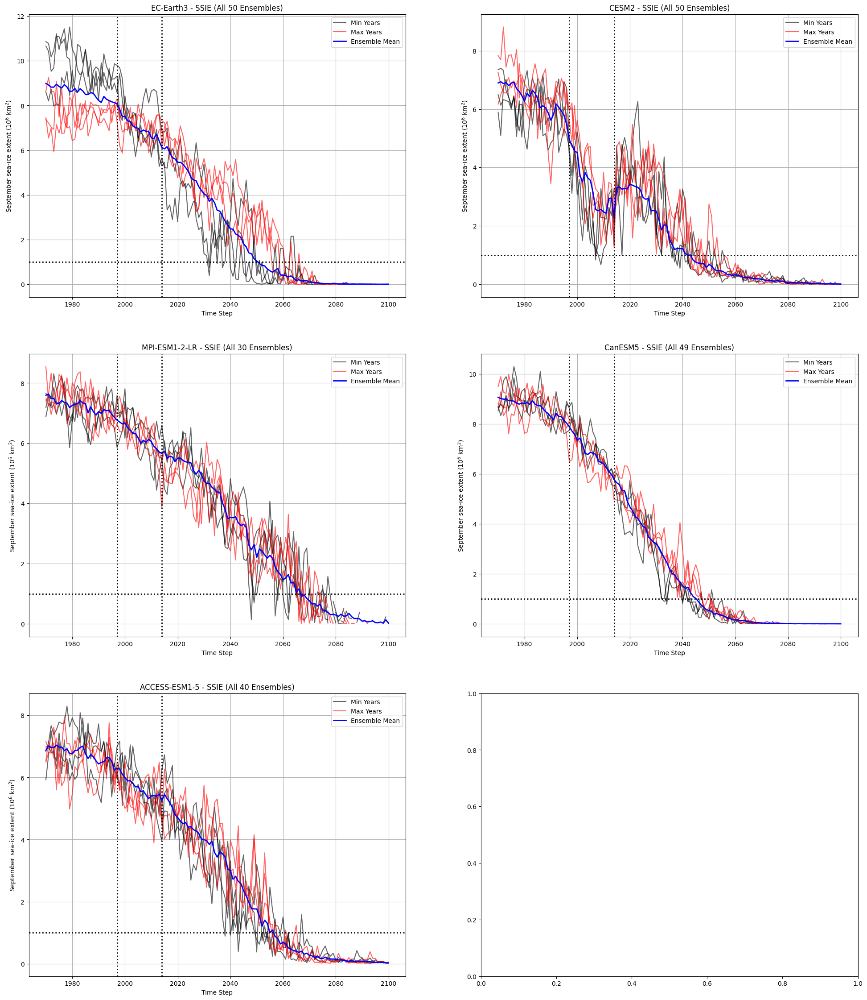

In [12]:
top = 3

plot_rows = ceil(len(MODEL_NAMES) / 2)

var = "ssie" # EC-Earth3, CESM2, MPI-ESM1-2-LR, CanESM5, ACCESS-ESM1-5

fig, axes = plt.subplots(nrows=plot_rows, ncols=2, figsize=(24, 28))
for i, ax in enumerate(axes.flat):
    if i < len(MODEL_NAMES):
        model = MODEL_NAMES[i] 
    else:
        continue
    data = model_data[var][model]

    biases = model_ensemble_biases[var][model]
    years = model_ensemble_icefree_years[model]

    df = DataFrame({"Bias": biases, "Year": years}).sort_values(by="Year")

    
    # Min Years
    min_years = df.head(top)
    ax.plot(data[min_years.index], color="black", alpha=0.6)
    ax.plot([], [], color="black", alpha=0.6, label="Min Years")

    # Max Years
    max_years = df.tail(top)
    ax.plot(data[max_years.index], color="red", alpha=0.6)
    ax.plot([], [], color="red", alpha=0.6, label="Max Years")

    # Ensemble average
    ax.plot(model_ensemble_avgs[var][model], color="blue", lw=2, label="Ensemble Mean")

    # GFED era
    ax.axvline(x=Timestamp('1997-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
    ax.axvline(x=Timestamp('2014-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
    ax.axhline(y=1, color='black', linestyle=':', linewidth=2)

    ax.legend()

    ax.set_title(f"{model} - {var.upper()} (All {data.shape[1]} Ensembles)")
    ax.set_xlabel("Time Step")
    ax.set_ylabel(VAR_YLABELS[var])
    ax.grid(True)

plt.show()

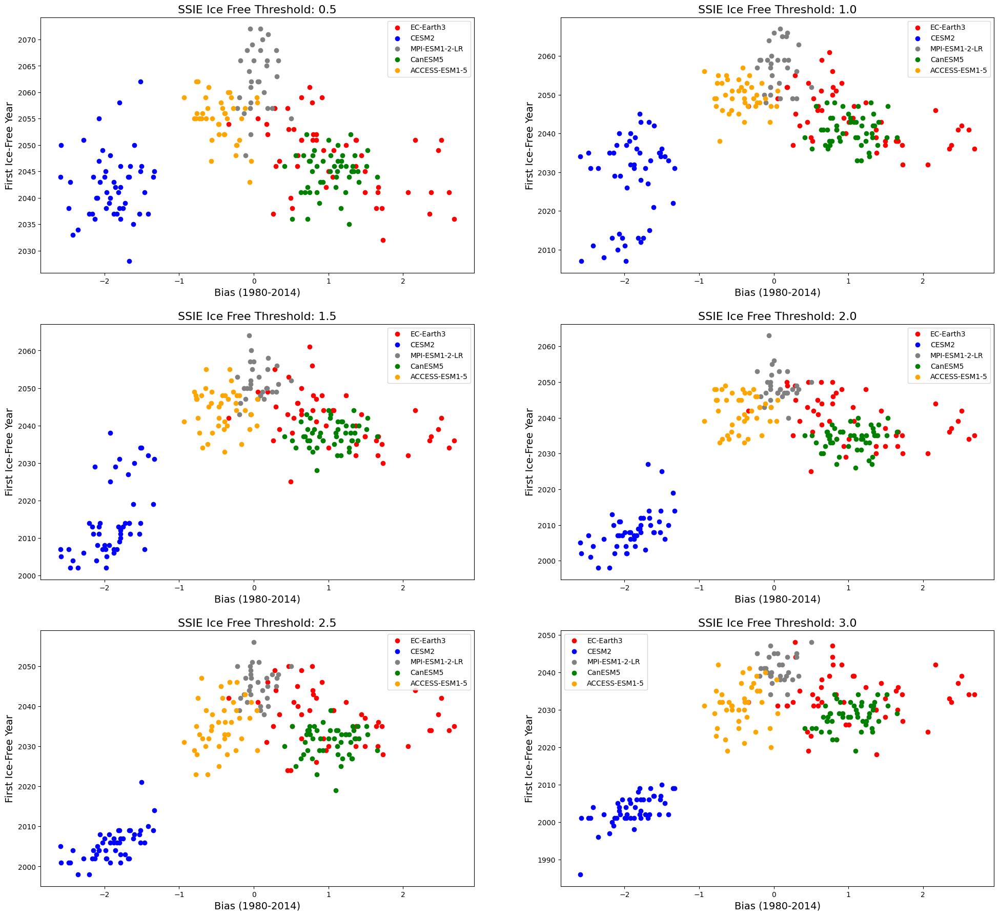

In [13]:

fig,axes = plt.subplots(plot_rows,2,figsize=(24,22))

var = "ssie"

for i, ax in enumerate(axes.flatten()):
    for model in MODEL_NAMES:
        threshold = 0.5 + i * 0.5
        ice_free_years = calculate_first_icefree_year(model_data["ssie"][model], threshold)
        ax.scatter(model_ensemble_biases[var][model], ice_free_years, c=MODEL_COLOURS[model], label=model)
    ax.legend()
    ax.set_title(VAR_YLABELS_SHORT[var] + f" Ice Free Threshold: {threshold}", fontsize=16)
    ax.set_xlabel("Bias (1980-2014)", fontsize=14)
    ax.set_ylabel("First Ice-Free Year", fontsize=14)

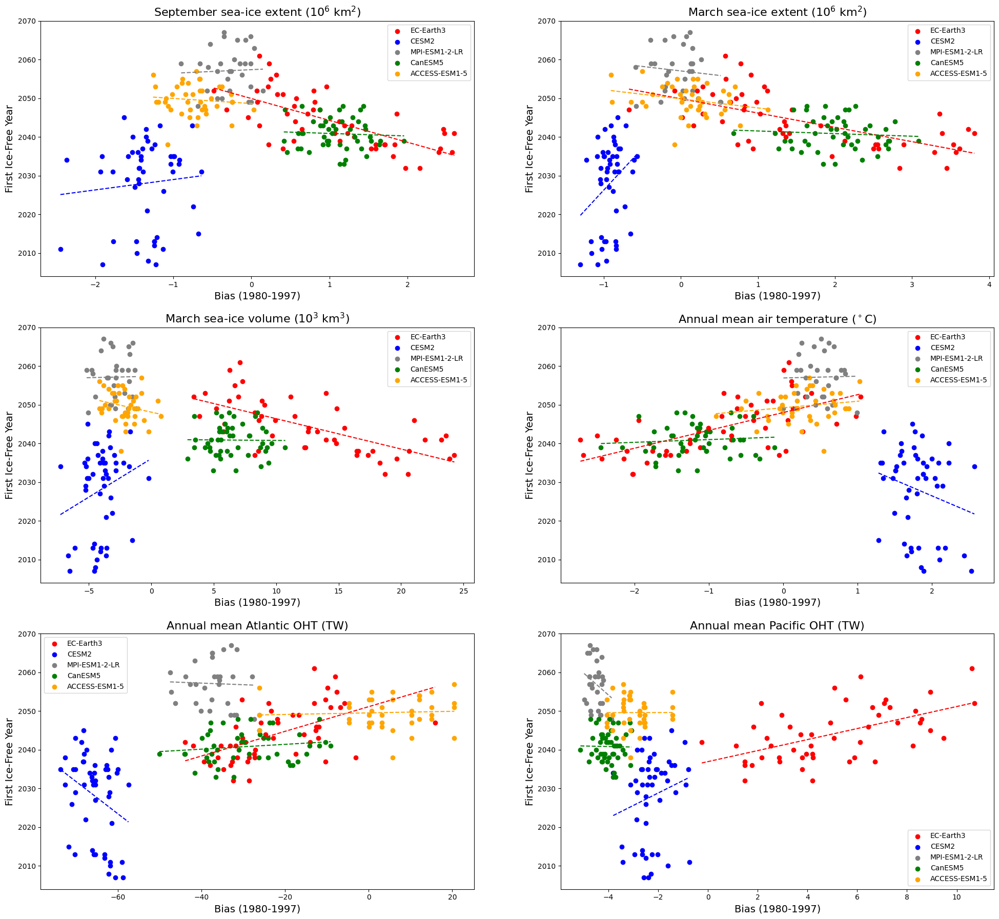

In [ ]:
obs_begin = '1980-01-01'
obs_end = '2014-01-01'

gfed_begin = '1997-01-01'
gfed_end = '2014-01-01'



pre_gfed_model_ensemble_biases = {
    var: {
        model: calculate_bias(model_data[var]["Observations"], model_data[var][model], obs_begin, gfed_begin)
        for model in MODEL_NAMES
    } for var in VARIABLES_
}

gfed_model_ensemble_biases = {
    var: {
        model: calculate_bias(model_data[var]["Observations"], model_data[var][model], gfed_begin, gfed_end)
        for model in MODEL_NAMES
    } for var in VARIABLES_
}



fig,axes = plt.subplots(plot_rows,2,figsize=(24,22))

for i, ax in enumerate(axes.flatten()):
    var = VARIABLES_[i]
    for model in MODEL_NAMES:
            x = pre_gfed_model_ensemble_biases[var][model].to_numpy()
            y = model_ensemble_icefree_years[model].dt.year.to_numpy()

            fit = LinearRegression().fit(x.reshape(-1, 1), y.reshape(-1, 1))

            ax.scatter(x, y, c=MODEL_COLOURS[model], label=model)

            predict_x = np.linspace(x.min(), x.max())
            predict_y = fit.predict(predict_x.reshape(-1, 1))

            ax.plot(predict_x, predict_y, color=MODEL_COLOURS[model], linestyle="--")


    ax.legend()
    ax.set_title(VAR_YLABELS[var], fontsize=16)
    ax.set_xlabel("Bias (1980-1997)", fontsize=14)
    ax.set_ylabel("First Ice-Free Year", fontsize=14)

## Autocorrelation

In [15]:
from scipy.signal import detrend

In [16]:
def plot_model_ac_average(
        var: str,
        model_data: DataFrame,
        ax: "Axes",
        start_year: str = "",
        end_year: str = "",
        fill_between: bool = False,
    ) -> "Axes":
    detrended = subtract_ensemble_mean(model_data)
    detrended = detrended.diff().dropna()

    acf_df = detrended.apply(lambda x: acf(x, nlags=100))
    acf_mean = calculate_ensemble_mean(acf_df)
    acf_min = calculate_ensemble_min(acf_df)
    acf_max = calculate_ensemble_max(acf_df)
    x = range(len(acf_mean))

    ax.plot(x, acf_mean, color=MODEL_COLOURS[model], label=model)
    if fill_between:
        ax.fill_between(
            x, acf_min, acf_max, color=MODEL_COLOURS[model], alpha=0.1,
        )
    ax.set_title(f"{VAR_YLABELS_SHORT[var]} Autocorrelation {start_year}-{end_year}")
    ax.grid(True)

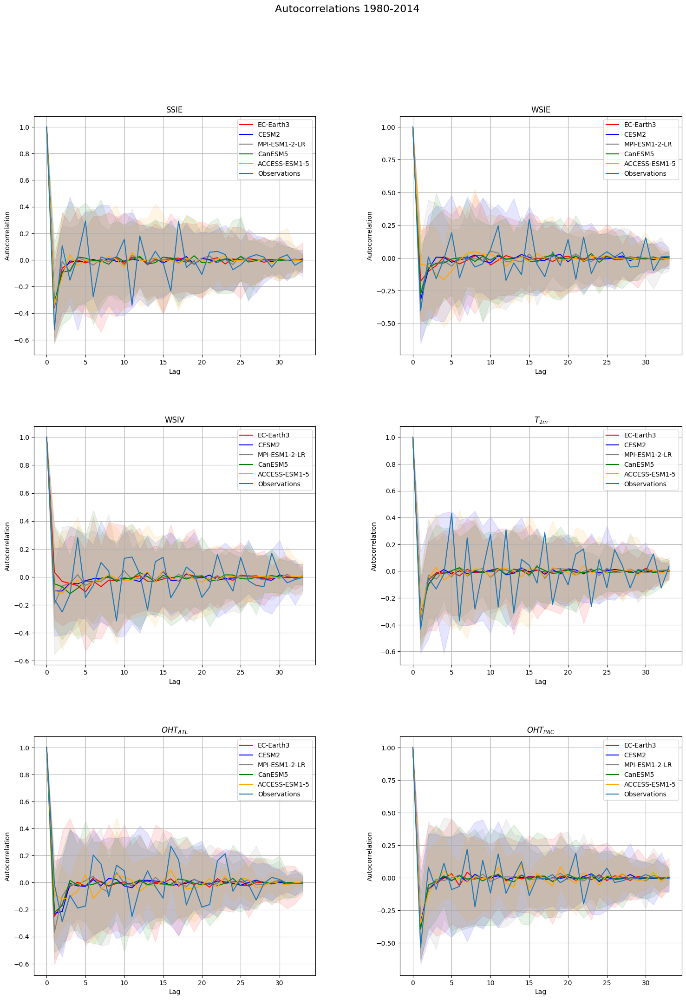

In [17]:
acf_start_year = "1980-01-01"
acf_end_year = "2014-01-01"


fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 24))

fig.suptitle('Autocorrelations 1980-2014', fontsize=16)

for i, ax in enumerate(axes.flat):
    if i >= len(VAR_NAMES[:-2]):
        continue 

    var = VAR_NAMES[:-2][i]
    for model in MODEL_NAMES:
        filtered = filter_by_years(model_data[var][model], acf_start_year, acf_end_year)
        plot_model_ac_average(var, filtered, ax, acf_start_year, acf_end_year, fill_between=True)

    obs_filtered = filter_by_years(observations[var], acf_start_year, acf_end_year)
    detrend_obs = detrend(obs_filtered)
    detrend_obs = np.diff(detrend_obs)
    acf_values = acf(detrend_obs, nlags=100)

    ax.plot(range(len(acf_values)), acf_values, label="Observations")

    ax.legend(loc='upper right')
    ax.set_xlabel('Lag')
    ax.set_ylabel('Autocorrelation')
    ax.set_title(VAR_YLABELS_SHORT[var])
    ax.grid(True)

fig.subplots_adjust(wspace=0.3, hspace=0.3)

For SSIE and WSIE, the autocorrelation decreases rapidly, becoming negligible after a lag of between 5 and 10 years. However, WSIE shows a slightly more persistent memory, with a wider range across models for when the autocorrelation reaches zero. Additionally, after crossing zero autocorrelation, the autocorrelations are more negative for WSIE.

WSIV follows a similar dynamic, especially to WSIE, although the range across models is narrower, and the persistence is more negative.

For TAS, the overall shape closely follows that of SSIE in terms of the first lag when autocorrelations reach zero and the range of values across models.

For OHT\_PAC, the decay is particularly pronounced, showing a weak memory in the time series.

Overall, we see that that the autocorrelations are relatively the same across different models for a given variable. For each of the models, the min and max autocorrelation has been plotted. As the lines represent the average of the autocorrelations, we can see that there is a lot of variation across the ensembles for a given model. 


<div style="display: none">Pour SSIE et WSIE, l’autocorrélation décroît rapidement, devenant négligeable après un lag d'entre 5 et 10 ans. Cepedant, WSIE présente une mémoire légèrement plus persistente, ayant un éventail plus large à travers les modèles pour quand ils atteignent 0. En plus, après traverser une autocorrélation 0, les autocorrélations sont plus négatives pour WSIE.

Le WSIV suit une dynamique similaire, surtout qu'au WSIE, bien que l'éventail des modèles soit plus étroit, et une persistance plus négatives.

Pour TAS, la forme générale suit celle de SSIE assez prochement, en termes de le premier lag quand les autocorrélations atteignent 0 et l'éventail des valeurs à travers les modèles.

Pour OHT_PAC, la décroissance est particulièrement marquée, montrant une mémoire faible des séries.</div> 

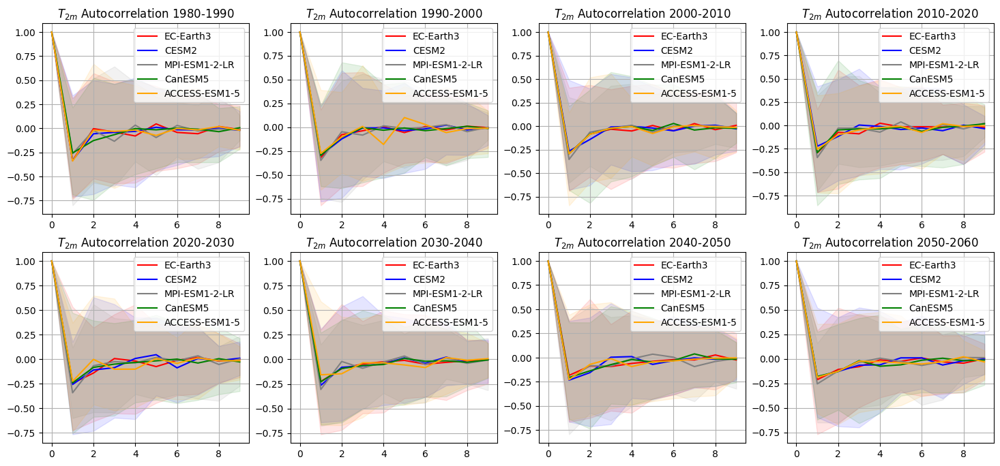

In [18]:
start_year = 1980
end_year = 2060

var = "tas"

year_range = range(start_year, end_year, 10)
n_periods = len(year_range)

nrows = ceil(n_periods / 4)
fig, axes = plt.subplots(nrows=nrows, ncols=4, figsize=(18, 4 * nrows))

for ax, year in zip(axes.flat, year_range):
    for model in MODEL_NAMES:
        corr_end_year = year+10
        filtered = filter_by_years(model_data[var][model], f"{year}-01-01", f"{corr_end_year}-01-01")
        plot_model_ac_average(
            var, filtered, ax, year, corr_end_year, fill_between=True
        )
        ax.legend()

Here we compute the autocorrelation for every 10-year segment between 1980 and 2060. We can see that the overall structure of the autocorrelation remains stable. This holds across all variables. Though the AC functions differ between variables, the variables remain consistent with the previous AC plot. In addition, the shape and persistance of the autocorrelation functions are consistent across decades for a given variable. The variations around the mean AC values are very similar to those observed over the entire time period. This suggests no significant shifts or regime changes over time.

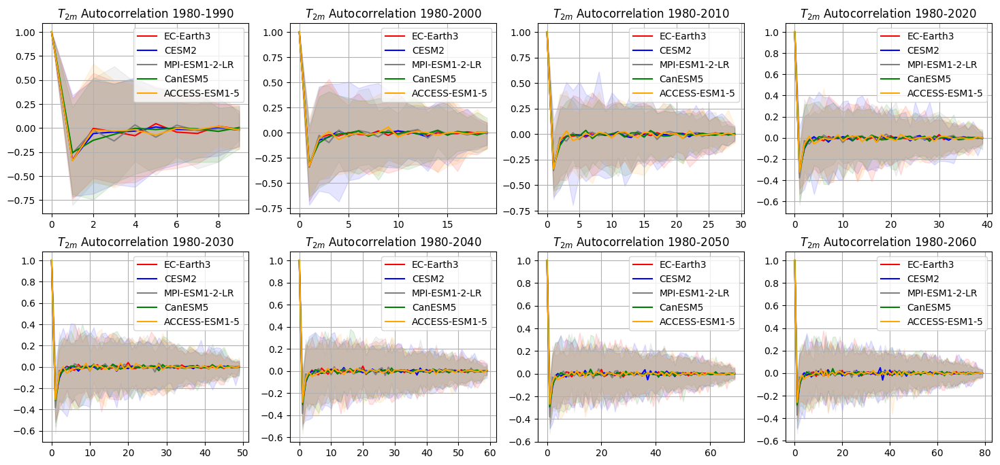

In [19]:
var = "tas"

year_range = range(start_year, end_year+10, 10)

n_periods = len(year_range[1:])
nrows = ceil(n_periods / 4)
fig, axes = plt.subplots(nrows=nrows, ncols=4, figsize=(18, 4 * nrows))

for ax, end_year in zip(axes.flat, year_range[1:]):
    for model in MODEL_NAMES:
        filtered = filter_by_years(model_data[var][model], f"{start_year}-01-01", f"{end_year}-01-01")
        plot_model_ac_average(
            var, filtered, ax, start_year, end_year, fill_between=True
        )
        ax.legend()

Here we plot the autocorrelations for various periods, each starting from 1980 and increasing by 10 years. Overall, the persistance and variability remains stable for a given variable as the period increases. In additon, what we see is consistent with previous plots. However, there are some notable deviations. For certain variables, e.g. SSIE, WSIE, TAS, WSIV, the autocorrelation function for the EC-Earth3 model starts to deform from a period of 50 years and onwards. The persistance starts to increase, while the other models remain stable, and the later lags become more negative. 

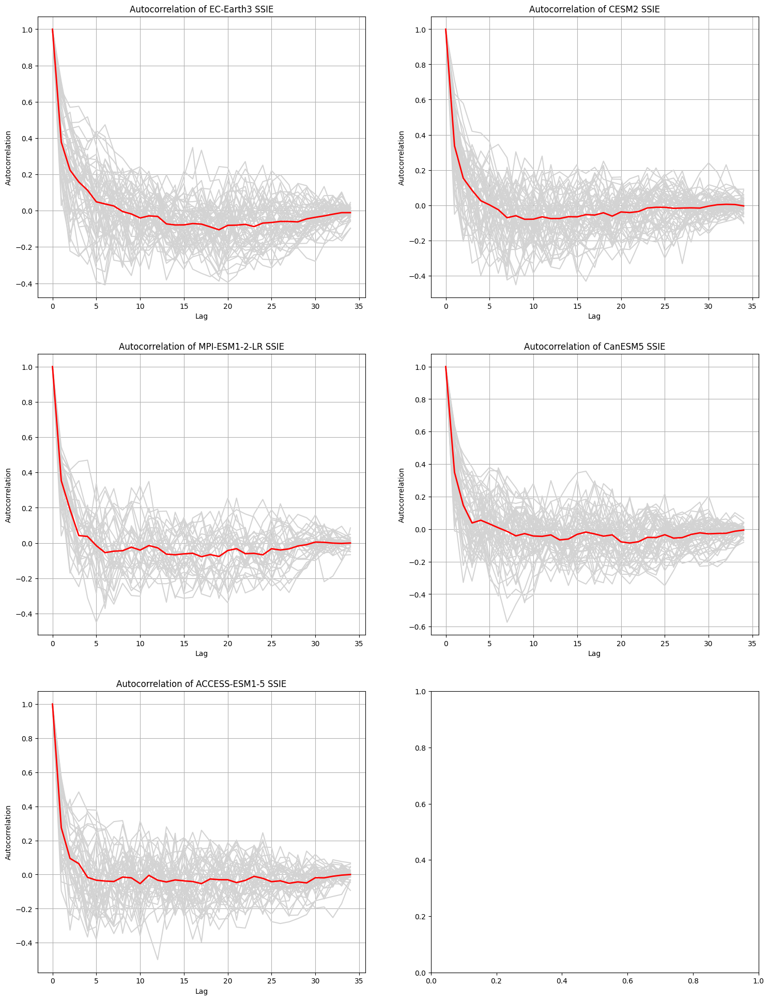

In [20]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 24))

var = "ssie"

for i, ax in enumerate(axes.flat):
    if i == 5:
        break
    var_data = filter_by_years(model_data[var][MODEL_NAMES[i]], acf_start_year, acf_end_year)
    var_detrended = var_data.subtract(var_data.mean(axis=1), axis=0)
    acf_df = var_detrended.apply(lambda x: acf(x, nlags=100))

    ax.plot(range(len(acf_df)), acf_df, color="lightgrey")
    ax.plot(range(len(acf_df)), acf_df.mean(axis=1), color="red", linewidth=2, label='Ensemble Mean')
    ax.set_xlabel('Lag')
    ax.set_ylabel('Autocorrelation')
    ax.set_title(f'Autocorrelation of {MODEL_NAMES[i]} {var.upper()}')
    ax.grid(True)

## Correlation

In [21]:
corr_start_year = "1970-01-01"
corr_end_year = "2060-01-01"

In [22]:
# Calculate the correlations between series like in the article
model_corrs = {}
for var in VAR_NAMES:
    model_corrs[var] = {}
    for model in MODEL_NAMES:
        x = filter_by_years(
            model_data[var][model], corr_start_year, corr_end_year,
        )
        x_detrended = subtract_ensemble_mean(x)

        y = filter_by_years(
            model_data["ssie"][model], corr_start_year, corr_end_year,
        )
        y_detrended = subtract_ensemble_mean(y)

        model_corrs[var][model] = calculate_correlation_ensemble_mean(
            x_detrended, y_detrended, corr_type="pearson",
        )


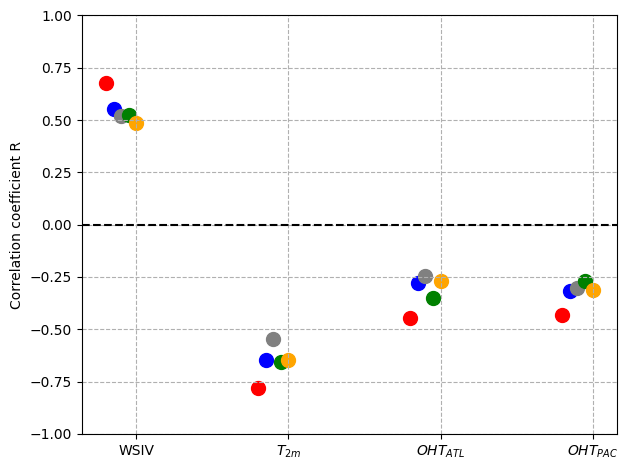

In [23]:

CORR_VARS = ["wsiv", "tas", "oht_atl", "oht_pac"]

fig, ax = plt.subplots()
ax.grid(linestyle='--')

for i, var in enumerate(CORR_VARS):
    for j, model in enumerate(MODEL_NAMES):

        corr = model_corrs[var][model]
        if np.isnan(corr):
            continue
        x = i - 0.2 + j * 0.05

        ax.scatter(x, corr, label=model, c=MODEL_COLOURS[model], s=100)


# Formatage
ax.set_xticks(range(len(CORR_VARS)))
ax.set_xticklabels([VAR_YLABELS_SHORT[var] for var in CORR_VARS])
ax.set_ylabel("Correlation coefficient R")
ax.axhline(0, color='black', linestyle='--')
ax.set_ylim(-1, 1)
ax.grid(linestyle='--')

plt.tight_layout()
plt.show()


The plot is fairly similar to what is in the article, though there are slight differences. It might be just be a scaling issue, but the correlations for OHT_ATL and OHT_PAC are closer to zero in the article.

## Causality

In [24]:
def calculate_all_liang_flows(
        model_data: dict,
        y_var: str,
        var_liangs: list[str],
        liang_start: str,
        liang_end: str,
        dt: int = 1,
        n_iter: int = 1000,
    ) -> dict:
    tau_avgs = {}
    combined_pvalues = {}
    ensemble_flows = {}
    ensemble_pvalues = {}
    for model in MODEL_NAMES:
        # Prepare data for liang flow calc
        ssie_liang = prepare_for_liang(model_data[y_var][model], liang_start, liang_end)
        liang_data = {
            var: prepare_for_liang(model_data[var][model], liang_start, liang_end) for var in var_liangs
        }

        # Liang flow calc
        liang_indexes, p_values = calculate_liang_model_flows(liang_data, ssie_liang, dt, n_iter)

        # Add ensemble flows and pvalues
        ensemble_flows[model] = np.array(liang_indexes)
        ensemble_pvalues[model] = p_values

        # Add ensemble mean flow and pvalue
        tau_avgs[model] = calculate_tau_avg(liang_indexes, var_liangs)
        combined_pvalues[model] = calculate_combined_pvalues(p_values, var_liangs)

    return {
        "tau_avgs": tau_avgs,
        "combined_pvalues": combined_pvalues,
        "ensemble_flows": ensemble_flows,
        "ensemble_pvalues": ensemble_pvalues,
    }


def plot_liang_tau_avgs(liang_res, var_liangs):
    fig, ax = plt.subplots()
    ax.grid(linestyle='--')

    jitter = 0.1

    for j, var in enumerate(var_liangs):
        for i, model in enumerate(MODEL_NAMES):

            tau = liang_res["tau_avgs"][model][var]
            pvalue = liang_res["combined_pvalues"][model][var]
            x = j - 0.2 + i * jitter

            # Black circle if significant
            kwargs = {"edgecolors": 'black', "linewidths": 2} if pvalue <= 0.05 else {}

            ax.scatter(x, tau, label=model, c=MODEL_COLOURS[model], s=100, **kwargs)

    ax.set_xticks(range(len(var_liangs)))
    ax.set_xticklabels([VAR_YLABELS_SHORT[var] for var in var_liangs])
    ax.set_ylabel("Information Transfer")
    ax.axhline(0, color='black', linestyle='--')
    ax.set_ylim(-1, 30)
    ax.grid(linestyle='--')
    ax.set_axisbelow(True)

    plt.tight_layout()

def plot_ensemble_bias_flows(liang_res, biases, var_liangs, bias_var: str | None = None) -> None:
    _, axes = plt.subplots(2,2,figsize=(24,18))

    for i, ax in enumerate(axes.flatten()):
        for model in MODEL_NAMES:

            var = var_liangs[i] if bias_var is None else bias_var
            model_biases = biases[var][model]
            flows = liang_res["ensemble_flows"][model][:,i]

            ax.scatter(model_biases, flows, c=MODEL_COLOURS[model], label=model)

        ax.legend()
        ax.set_title(f"{VAR_YLABELS_SHORT[var]} Bias v Liang Flow ({VAR_YLABELS_SHORT[var_liangs[i]]} $-->$ ssie)", fontsize=16)
        ax.set_xlabel("Bias (1980-2014)", fontsize=14)
        ax.set_ylabel("Liang Flow (1970-2060)", fontsize=14)

In [30]:
dt = 1
n_iter = 1000
liang_start = "1970-01-01"
liang_end = "2060-01-01"
var_liangs = ["wsiv", "tas", "oht_atl", "oht_pac"]


liang_res = calculate_all_liang_flows(model_data, "ssie", var_liangs, liang_start, liang_end)


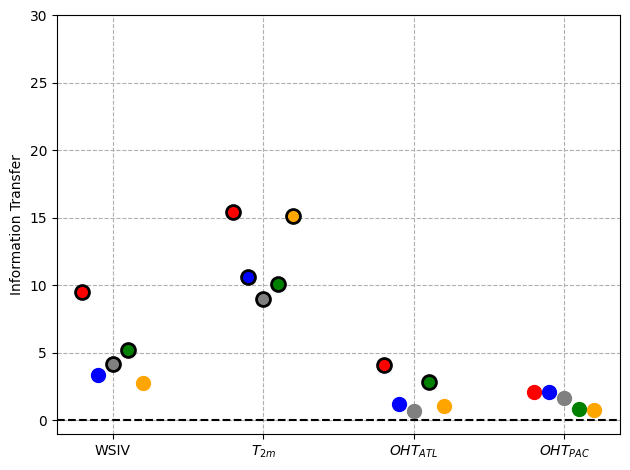

In [31]:
plot_liang_tau_avgs(liang_res, var_liangs)

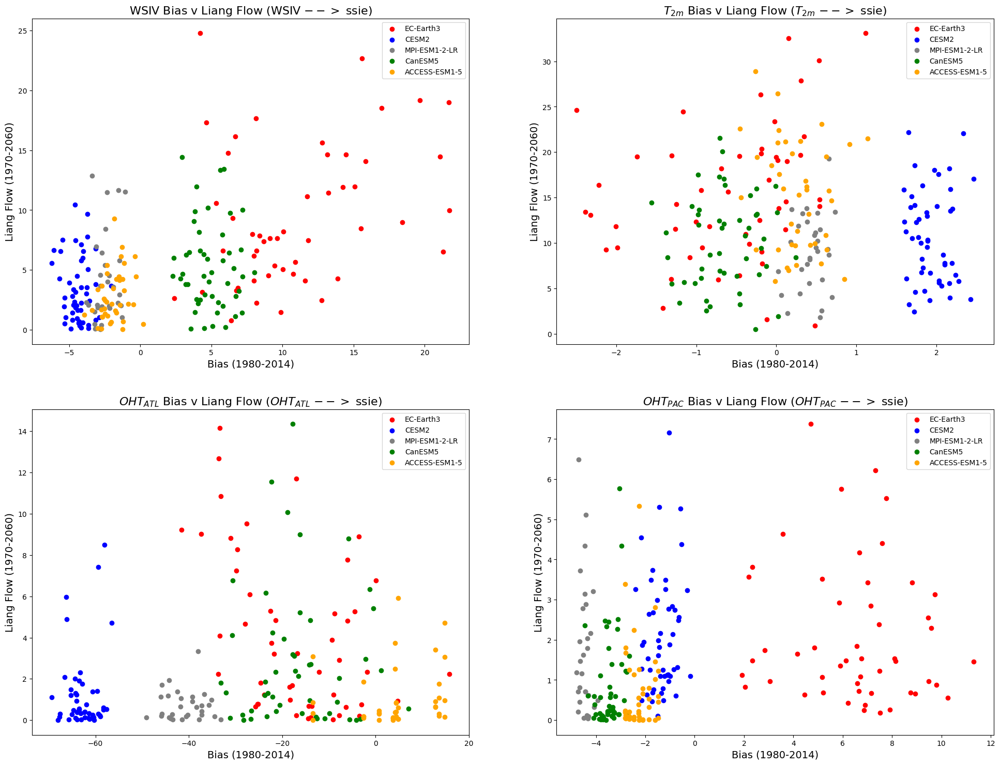

In [33]:
plot_ensemble_bias_flows(liang_res, model_ensemble_biases, var_liangs)

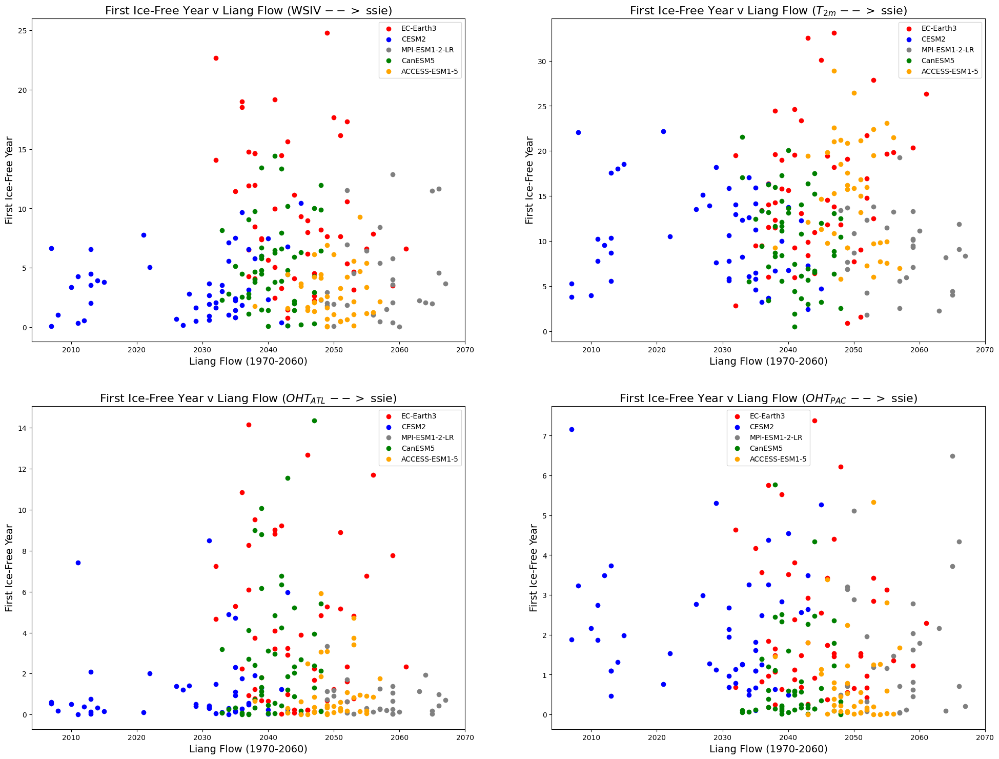

In [34]:
fig,axes = plt.subplots(2,2,figsize=(24,18))

for i, ax in enumerate(axes.flatten()):
    for model in MODEL_NAMES:

        biases = model_ensemble_biases[var_liangs[i]][model]
        flows = liang_res["ensemble_flows"][model][:,i]
        years = model_ensemble_icefree_years[model].dt.year.to_numpy()

        ax.scatter(years, flows, c=MODEL_COLOURS[model], label=model)

    ax.legend()
    ax.set_title(f"First Ice-Free Year v Liang Flow ({VAR_YLABELS_SHORT[var_liangs[i]]} $-->$ ssie)", fontsize=16)
    ax.set_xlabel("Liang Flow (1970-2060)", fontsize=14)
    ax.set_ylabel("First Ice-Free Year", fontsize=14)

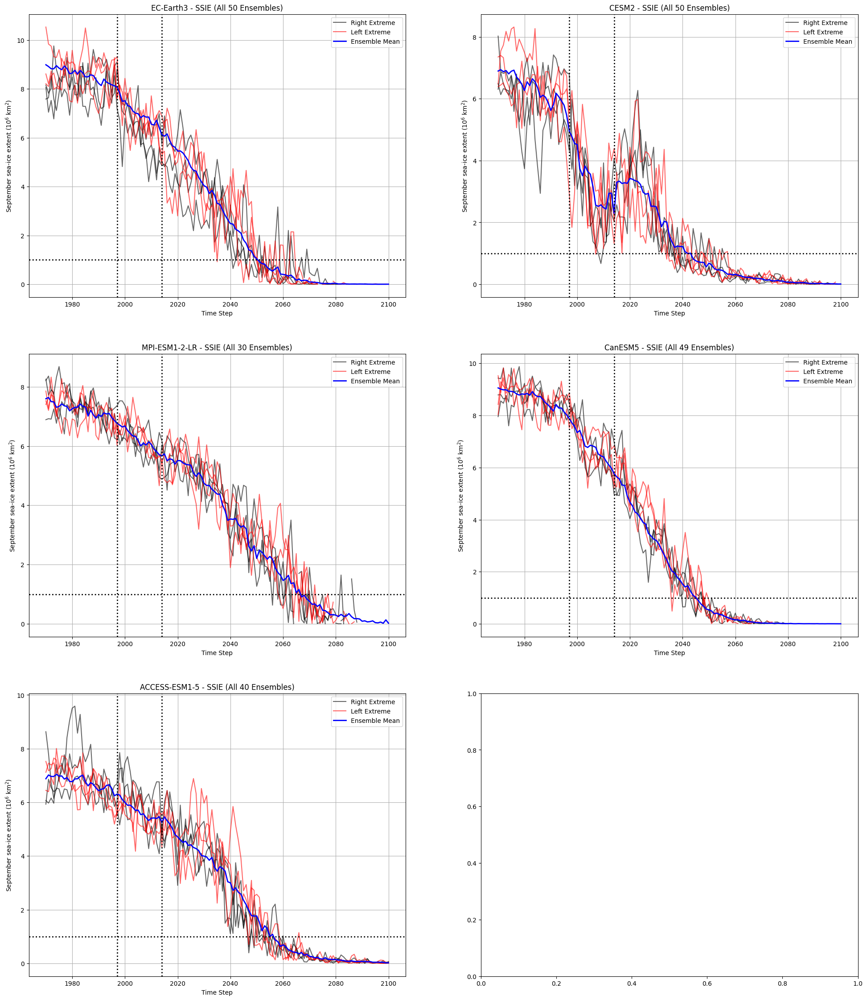

In [29]:
top = 3

plot_rows = ceil(len(MODEL_NAMES) / 2)

var = "ssie" # EC-Earth3, CESM2, MPI-ESM1-2-LR, CanESM5, ACCESS-ESM1-5
flow_var = "tas"

fig, axes = plt.subplots(nrows=plot_rows, ncols=2, figsize=(24, 28))
for i, ax in enumerate(axes.flat):
    if i < len(MODEL_NAMES):
        model = MODEL_NAMES[i] 
    else:
        continue
    data = model_data[var][model]

    df = DataFrame(
        liang_res['ensemble_flows'][model],
        columns=[*var_liangs, "ssie"],
    ).sort_values(
        by=flow_var,
        ascending=False,
    )

    # Right bias extremes
    pos_biases = df.head(top)
    ax.plot(data[pos_biases.index], color="black", alpha=0.6)
    ax.plot([], [], color="black", alpha=0.6, label="Right Extreme")

    # Left bias extremes
    neg_biases = df.tail(top)
    ax.plot(data[neg_biases.index], color="red", alpha=0.6)
    ax.plot([], [], color="red", alpha=0.6, label="Left Extreme")

    # Ensemble mean
    ax.plot(model_ensemble_avgs[var][model], color="blue", lw=2, label="Ensemble Mean")

    # GFED era
    ax.axvline(x=Timestamp('1997-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
    ax.axvline(x=Timestamp('2014-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
    ax.axhline(y=1, color='black', linestyle=':', linewidth=2)

    ax.legend()

    ax.set_title(f"{model} - {var.upper()} (All {data.shape[1]} Ensembles)")
    ax.set_xlabel("Time Step")
    ax.set_ylabel(VAR_YLABELS[var])
    ax.grid(True)

plt.show()



## PCA (In Progress)

In this section, we will do a PCA on the model ensemble averages for SSIE. The idea is keep 2 or 3 the principal components that explain most of the variance (more than 90% hopefully). Detrending is applied to the ensemble averages before applying PCA.

Next, we calculate the biases for each variable for all model ensemble averages. This is calculated as the model ensemble average minus the mean observation over the period (1980-2014), which gives a series of biases for each variable and model. 

A linear regression is performed on the PCA to predict the biases. A regression is done for per variable per model.


All data are filtered to be between 1980 and 2014. 

In [16]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from scipy.signal import detrend

In [17]:
def plot_model_df(model_df: DataFrame, ax: "Axes" = None) -> None:
    """Columns of model_df must be the model names."""
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(8, 5))

    for col, color in zip(model_df, MODEL_COLOURS.values()):
        ax.plot(model_df[col].index, model_df[col], label=col, color=color)
    ax.legend()

In [18]:
pca_start = "1980-01-01"
pca_end = "2014-01-01"

# Filter and detrend the SSIE model ensemble averages
# by subtracting the mean series of the models
# We use this for the PCA
ssie_df = filter_by_years(DataFrame(model_ensemble_avgs["ssie"]), pca_start, pca_end)
ssie_detrended = subtract_ensemble_mean(ssie_df)
ssie_detrended_diffed = ssie_detrended.diff()

ssie_detrended.head()

,EC-Earth3,CESM2,MPI-ESM1-2-LR,CanESM5,ACCESS-ESM1-5
1980-01-01,1.095124,-1.284803,-0.293037,1.261848,-0.779132
1981-01-01,1.095667,-1.118784,-0.363164,1.178604,-0.792322
1982-01-01,1.004791,-1.173236,-0.290249,1.179602,-0.720908
1983-01-01,1.012280,-1.094316,-0.320701,1.176342,-0.773605
1984-01-01,0.986351,-1.122410,-0.328987,1.120239,-0.655193


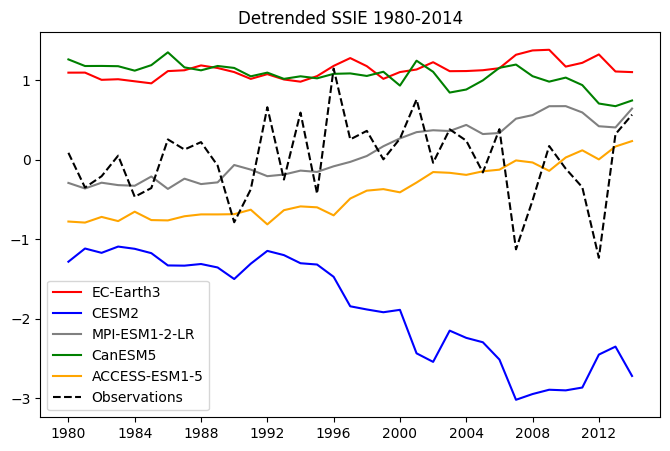

In [19]:
pca_input = ssie_detrended.dropna()

# Plot detrended SSIE series
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
plot_model_df(pca_input, ax)

# Plot the detrended observation series for reference
# Observations are not included in the PCA
ssie_obs = filter_by_years(observations["ssie"], pca_start, pca_end)
ssie_obs_detrended  = detrend(ssie_obs)
ax.plot(pca_input.index, ssie_obs_detrended, "k--", label="Observations")

ax.set_title("Detrended SSIE 1980-2014")
_ = ax.legend()

Detrended SSIE series for each model plotted with the detrended observations. CESM2 has a fairly pronounced deviation from the rest, while the others are relatively closer and moving in similar directions.

In [20]:
# Fill nans and scale data
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(pca_input)
X_scaled = StandardScaler().fit_transform(X_imputed)

# PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

scores = pd.DataFrame(X_pca, index=pca_input.index, columns=[f"PC{i+1}" for i in range(X_pca.shape[1])])
loadings = pd.DataFrame(pca.components_.T, index=pca_input.columns, columns=[f"PC{i+1}" for i in range(X_pca.shape[1])])

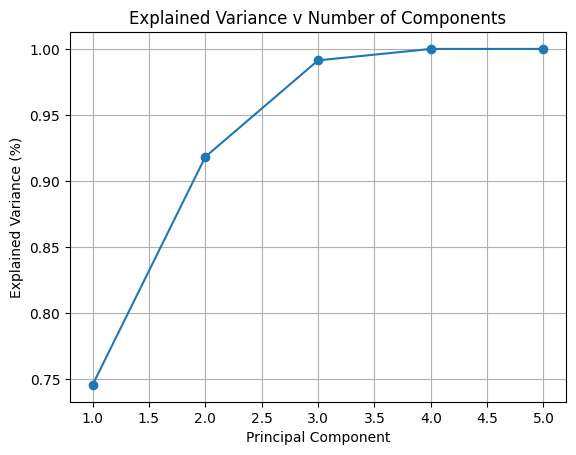

In [21]:
# Scree plot (variance expliquée)
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance (%)')
plt.title('Explained Variance v Number of Components')
plt.grid(True)
plt.show()


We can see that the first two principal components explain more than 90% of the variance. Hence, we take these two for the regression.
<div style="display: none">Ici on peut voir que les deux composantes principales expliquent plus de 90 % de la variance. On prend donc ces deux pour faire la régression.</div>

In [22]:
loadings

,PC1,PC2,PC3,PC4,PC5
EC-Earth3,0.361254,0.638084,0.666561,0.035336,0.129583
CESM2,-0.500453,-0.193409,0.303865,-0.009959,0.787214
MPI-ESM1-2-LR,0.503709,-0.019834,-0.299430,-0.691367,0.422182
CanESM5,-0.337457,0.731665,-0.557309,0.085309,0.181432
ACCESS-ESM1-5,0.501440,-0.140408,-0.251217,0.716510,0.390317


The loadings give the new axes resulting from the PCA. All models move relatively strongly with or against PC1, whereas EC-Earth3 and CanESM5 move the most with respect to PC2. MP-ESM1-2-LR on the hand moves very little with PC2. We expect similar relationships to emerge the the coefficients of the regressions. 

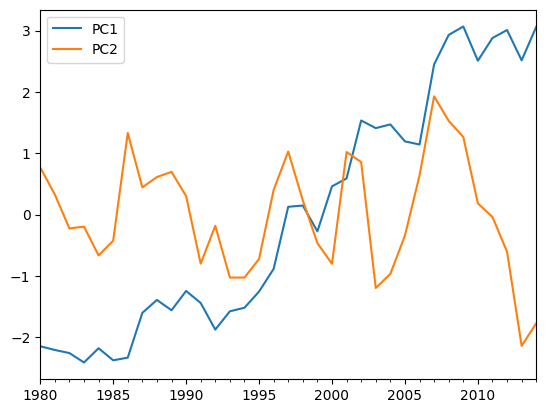

In [23]:
X = scores[["PC1", "PC2"]]
_ = X.plot()

These are the first two principal components displayed as time series. As can be seen, PC1 displays a strong uptrend over the period, while PC2 capture more stationary movement. If the biases display clear trends, then we expect the regressions to produce statistically significant results.

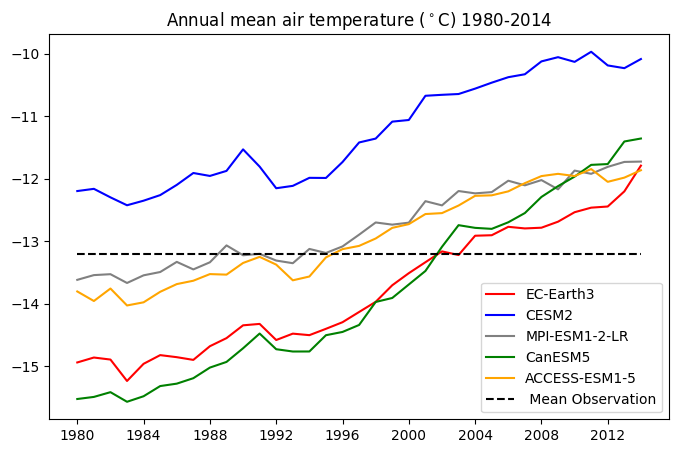

In [24]:
var = "tas"

var_df = filter_by_years(DataFrame(model_ensemble_avgs[var]), pca_start, pca_end)
obs_series = filter_by_years(observations[var], pca_start, pca_end)

fig, ax = plt.subplots(1, 1, figsize=(8, 5))
plot_model_df(var_df, ax)

ax.set_title(f"{VAR_YLABELS[var]} 1980-2014")
ax.hlines(obs_series.mean(), obs_series.index[0], obs_series.index[-1], "black", "--", label=" Mean Observation")
_ = ax.legend()

Here we plot the variable for each model over the period against the average observation for the same period. We can generally see that the variables display trends, either positive or negative. Since we calculate the biases by substracting the average observation, we are simply shifting the series and the underlying trends remain present. Hence, the regressions are likely to produce significant results.

In [25]:
mmm_deviations_all = {}

for var in VARIABLES_:
    var_df = filter_by_years(DataFrame(model_ensemble_avgs[var]), pca_start, pca_end)
    obs_series = filter_by_years(observations[var], pca_start, pca_end)
    mmm_deviations_all[var] = var_df - obs_series.mean()

In [26]:
from sklearn.linear_model import LinearRegression

X = scores[["PC1", "PC2"]]

ypreds = {}
resids = {}

df_in = []

for var in VARIABLES_:
    ypreds[var] = {}
    resids[var] = {}

    for model in MODEL_NAMES:
        y = mmm_deviations_all[var][model]

        linear_reg = LinearRegression()
        linear_reg.fit(X, y)

        df_in.append({
            "variable": var,
            "model": model,
            "B0": linear_reg.intercept_,
            "B1": linear_reg.coef_[0],
            "B2": linear_reg.coef_[1],
            "R2": linear_reg.score(X, y),
        })

        y_pred = linear_reg.predict(X)
        ypreds[var][model] = y_pred
        resids[var][model] = y - y_pred


pca_reg_df = DataFrame(df_in)
pca_reg_df

,variable,model,B0,B1,B2,R2
0,ssie,EC-Earth3,1.098907,-0.402667,0.118593,0.954363
1,ssie,CESM2,-1.903499,-0.768026,-0.076148,0.975261
2,ssie,MPI-ESM1-2-LR,0.057114,-0.265199,0.043115,0.941772
3,ssie,CanESM5,1.028284,-0.492219,0.160089,0.986051
4,ssie,ACCESS-ESM1-5,-0.443156,-0.279238,0.004629,0.953415
5,wsie,EC-Earth3,1.309987,-0.329917,0.082931,0.967326
6,wsie,CESM2,-0.911472,-0.172062,0.015768,0.951699
7,wsie,MPI-ESM1-2-LR,-0.134815,-0.226196,0.031957,0.936811
8,wsie,CanESM5,1.541971,-0.463019,0.126959,0.968229
9,wsie,ACCESS-ESM1-5,0.052089,-0.204844,0.003905,0.963490


A regression is performed for each variable-model pair. B0 is the intercept, B1 is the coefficient for PC1, and B2 is the coefficient for PC2. R2 is the $R^2$.

As can be seen, most of the regression are significant, as they produce high R2s and the coefficients are relatively large. 

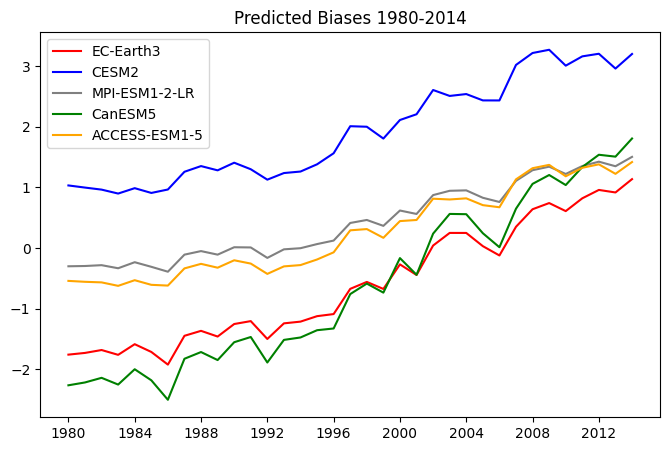

In [27]:
var = "tas"

fig, ax = plt.subplots(1, 1, figsize=(8, 5))

for model in MODEL_NAMES:
    ax.plot(var_df.index, ypreds[var][model], color=MODEL_COLOURS[model], label=model)
_ = ax.legend()
_ = ax.set_title("Predicted Biases 1980-2014")

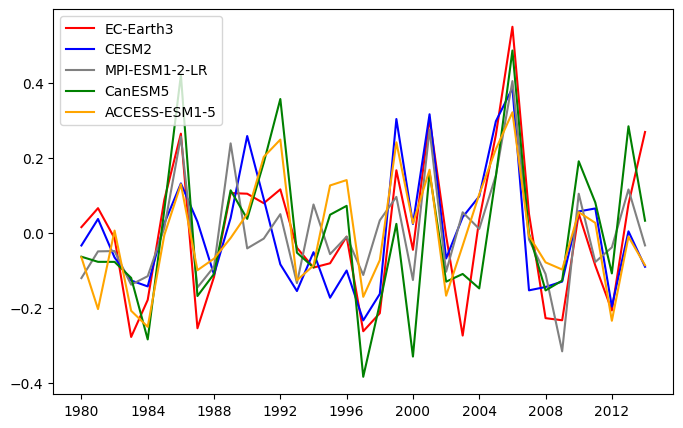

In [28]:
var = "tas" 
resid_df = DataFrame(resids[var])
plot_model_df(resid_df)

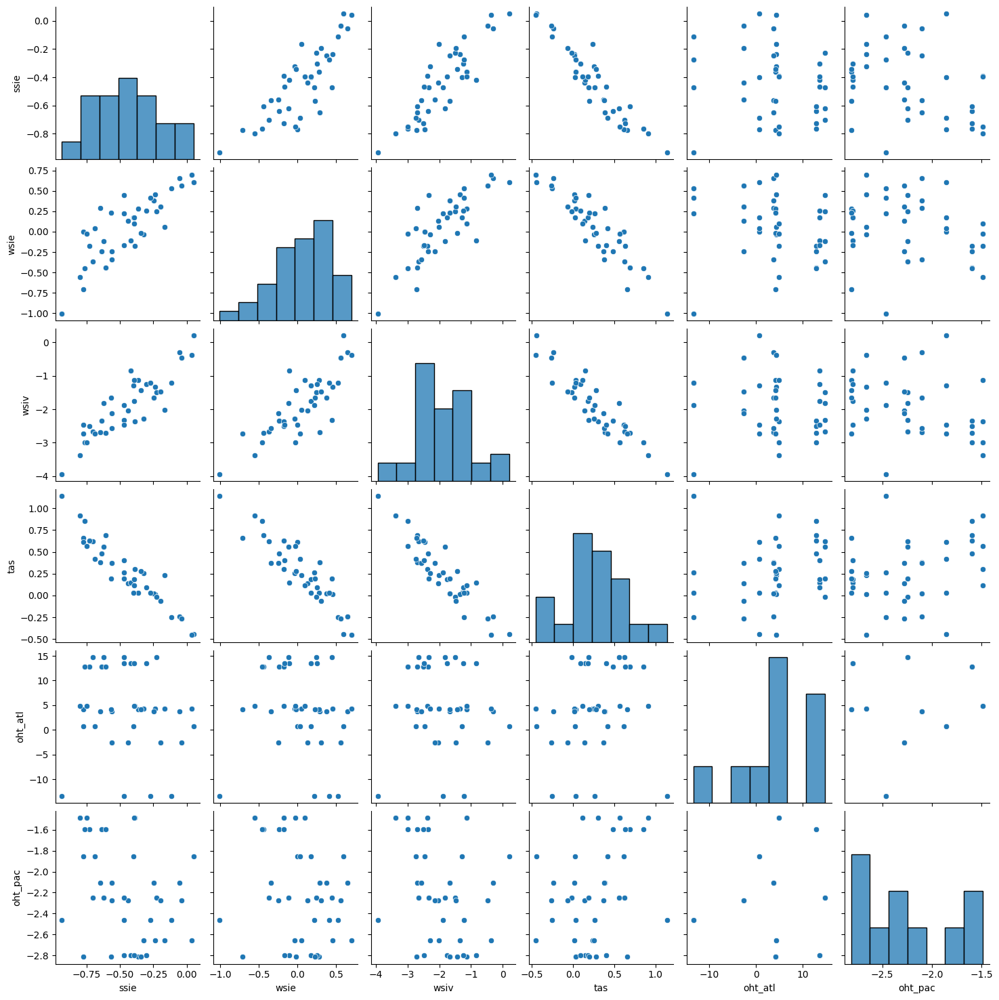

In [93]:
import seaborn as sns

# All model averages for a given variable
var = "tas"
ensemble_var_df = DataFrame(model_ensemble_avgs[var])

# All variables for a given model
model = 'EC-Earth3' # 'EC-Earth3', 'CESM2', 'MPI-ESM1-2-LR', 'CanESM5', 'ACCESS-ESM1-5'
model_vars_df = DataFrame({var: model_ensemble_avgs[var][model] for var in VAR_NAMES[:-2]})

# Ensemble biases for a given variable
var = "tas"
ensemble_var_biases_df = DataFrame(model_ensemble_biases[var])

# Biases of all variables for a given model
model = 'ACCESS-ESM1-5' # 'EC-Earth3', 'CESM2', 'MPI-ESM1-2-LR', 'CanESM5', 'ACCESS-ESM1-5'
model_vars_biases_df = DataFrame({var: model_ensemble_biases[var][model] for var in VAR_NAMES[:-2]})

_ = sns.pairplot(model_vars_biases_df)